In [1]:
import tensorflow as tf
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
googledrive_path = ""
train_dir = googledrive_path + "train/"
load_generator = True
load_discriminator = True

im_inx = list(map(lambda x: train_dir + x, os.listdir(train_dir)))

In [2]:
def gen_block(x):
    x_ = x
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization(momentum=0.5)(x)
    x = tf.keras.layers.PReLU(shared_axes=[1,2])(x)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization(momentum=0.5)(x)
    return x + x_

input = tf.keras.Input(shape=(None,None,3))
output = tf.keras.layers.Conv2D(64, 9, padding='same')(input)
output = tf.keras.layers.PReLU(shared_axes=[1,2])(output)
output_ = output

for _ in range(5):
    output = gen_block(output)

output = tf.keras.layers.Conv2D(64, 3, padding='same')(output)
output = tf.keras.layers.BatchNormalization(momentum=0.5)(output) + output_

output = tf.keras.layers.Conv2D(256, 3, padding='same')(output)
output = tf.keras.layers.PReLU(shared_axes=[1,2])(output)
output = tf.nn.depth_to_space(output, 2)

output = tf.keras.layers.Conv2D(256, 3, padding='same')(output)
output = tf.keras.layers.PReLU(shared_axes=[1,2])(output)
output = tf.nn.depth_to_space(output, 2)

output = tf.keras.layers.Conv2D(3, 9, padding='same')(output)
Generator = tf.keras.models.Model(input, output)

checkpoint_gen = tf.train.Checkpoint(Generator)
save_path_gen = checkpoint_gen.save(googledrive_path + '/tmp/Generator_chkp/')
if load_generator: checkpoint_gen.restore(save_path_gen)

In [3]:
def dis_block(x,k,n,s):
  x= tf.keras.layers.Conv2D(n, k, strides=s, padding='same')(x)
  x = tf.keras.layers.BatchNormalization(momentum=0.8)(x)
  x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
  return x

input = tf.keras.Input(shape=(224,224,3))
output = tf.keras.layers.Conv2D(64, 3, 1, padding='same')(input)
output = tf.keras.layers.LeakyReLU(alpha=0.2)(output)

output = dis_block(output,3,64,2)
output = dis_block(output,3,128,1)
output = dis_block(output,3,128,2)
output = dis_block(output,3,256,1)
output = dis_block(output,3,256,2)
output = dis_block(output,3,512,1)
output = dis_block(output,3,512,2)

output = tf.keras.layers.Flatten()(output)
output = tf.keras.layers.Dense(1000)(output)
output = tf.keras.layers.LeakyReLU(alpha=0.2)(output)
output = tf.keras.layers.Dense(1, activation='sigmoid')(output)
Discriminator = tf.keras.Model(input, output)

checkpoint_dis = tf.train.Checkpoint(Discriminator)
save_path_dis = checkpoint_dis.save(googledrive_path + '/tmp/Discriminator_chkp/')
if load_discriminator: checkpoint_dis.restore(save_path_dis)

In [4]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
vgg = tf.keras.Model(vgg.input, vgg.layers[20].output)

input = tf.keras.Input((None,None,3))
input = tf.keras.applications.vgg19.preprocess_input(input)
output = vgg(input)

feature_extractor = tf.keras.Model(input, output)
feature_extractor.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 model_2 (Functional)        (None, None, None, 512)   20024384  
                                                                 
Total params: 20,024,384
Trainable params: 20,024,384
Non-trainable params: 0
_________________________________________________________________


In [5]:
#Generator = tf.keras.models.load_model(googledrive_path + 'Generator.h5')
#Discriminator = tf.keras.models.load_model(googledrive_path + 'Discriminator.h5')

epochs 1 step 2 2201 G loss 0.19293 D loss 0.69187
predict real: 0.502
predict_fake: 0.5

epochs 1 step 4 2201 G loss 0.1619 D loss 0.61108
predict real: 0.618
predict_fake: 0.522

epochs 1 step 6 2201 G loss 0.2998 D loss 0.55913
predict real: 0.801
predict_fake: 0.591

epochs 1 step 8 2201 G loss 0.12043 D loss 0.56919
predict real: 0.834
predict_fake: 0.614



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 10 2201 G loss 0.14335 D loss 0.37806
predict real: 0.948
predict_fake: 0.505



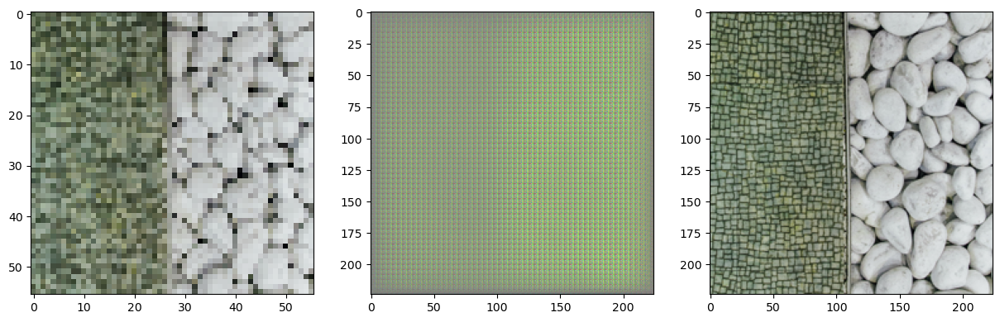

epochs 1 step 12 2201 G loss 0.25745 D loss 0.21978
predict real: 0.994
predict_fake: 0.352

epochs 1 step 14 2201 G loss 0.12749 D loss 0.1022
predict real: 0.997
predict_fake: 0.182

epochs 1 step 16 2201 G loss 0.57815 D loss 0.61389
predict real: 0.536
predict_fake: 0.042

epochs 1 step 18 2201 G loss 0.39436 D loss 0.0481
predict real: 0.997
predict_fake: 0.088

epochs 1 step 20 2201 G loss 0.43036 D loss 0.15605
predict real: 1.0
predict_fake: 0.268



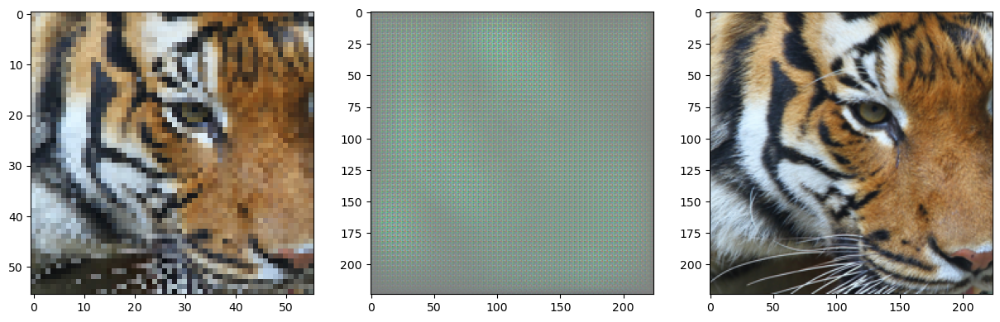

epochs 1 step 22 2201 G loss 0.24179 D loss 0.23376
predict real: 1.0
predict_fake: 0.372

epochs 1 step 24 2201 G loss 0.40493 D loss 0.19953
predict real: 1.0
predict_fake: 0.327

epochs 1 step 26 2201 G loss 0.09405 D loss 0.14129
predict real: 1.0
predict_fake: 0.244

epochs 1 step 28 2201 G loss 0.13799 D loss 0.87289
predict real: 0.463
predict_fake: 0.064



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 30 2201 G loss 0.13268 D loss 0.02904
predict real: 0.995
predict_fake: 0.052



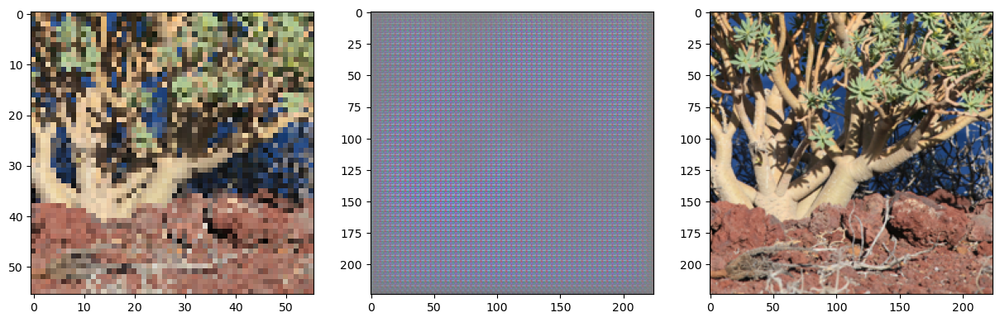

epochs 1 step 32 2201 G loss 0.24265 D loss 0.03027
predict real: 1.0
predict_fake: 0.058

epochs 1 step 34 2201 G loss 0.11945 D loss 0.05766
predict real: 0.943
predict_fake: 0.053

epochs 1 step 36 2201 G loss 0.24925 D loss 0.03677
predict real: 0.983
predict_fake: 0.055

epochs 1 step 38 2201 G loss 0.14693 D loss 0.04619
predict real: 1.0
predict_fake: 0.088



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 40 2201 G loss 0.15237 D loss 0.00978
predict real: 1.0
predict_fake: 0.019



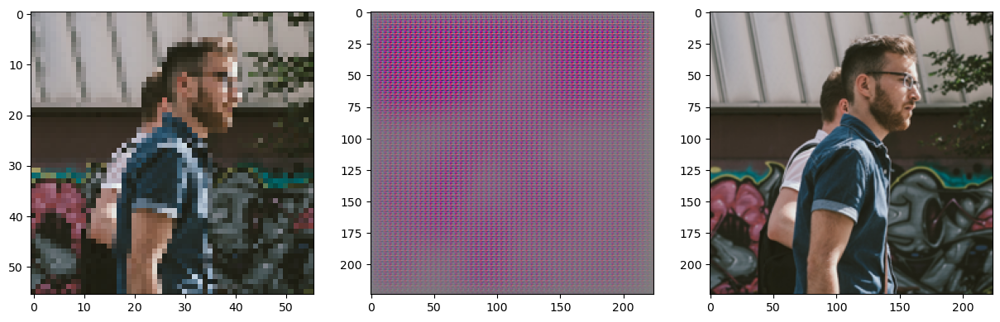

epochs 1 step 43 2201 G loss 0.16208 D loss 0.00422
predict real: 0.997
predict_fake: 0.006

epochs 1 step 45 2201 G loss 0.42353 D loss 0.89193
predict real: 0.511
predict_fake: 0.001

epochs 1 step 47 2201 G loss 0.22802 D loss 9.11165
predict real: 1.0
predict_fake: 1.0



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 49 2201 G loss 0.22151 D loss 1.07763
predict real: 1.0
predict_fake: 0.871



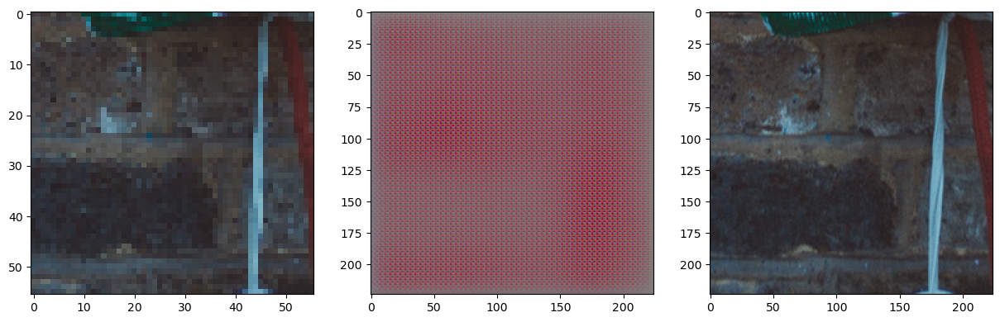

epochs 1 step 51 2201 G loss 0.29854 D loss 3.92224
predict real: 0.002
predict_fake: 0.0

epochs 1 step 53 2201 G loss 0.20816 D loss 1.63403
predict real: 0.039
predict_fake: 0.0

epochs 1 step 55 2201 G loss 0.31356 D loss 2.20445
predict real: 0.106
predict_fake: 0.0

epochs 1 step 57 2201 G loss 0.5633 D loss 1.86117
predict real: 0.166
predict_fake: 0.008



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 59 2201 G loss 0.29195 D loss 1.41678
predict real: 0.088
predict_fake: 0.287



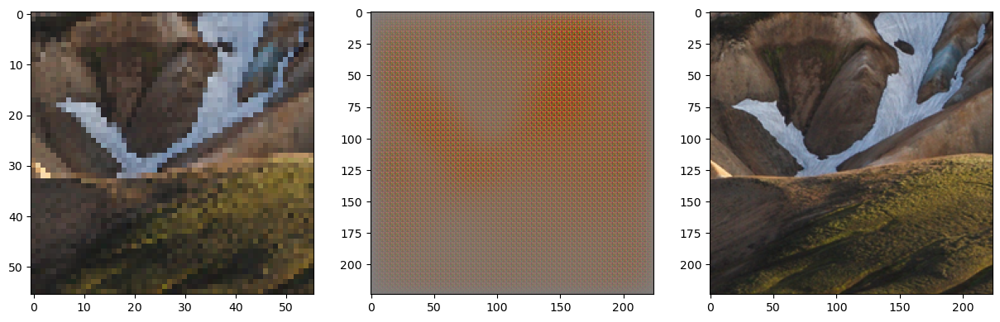

epochs 1 step 61 2201 G loss 0.14163 D loss 0.90808
predict real: 0.895
predict_fake: 0.779

epochs 1 step 63 2201 G loss 0.29004 D loss 0.70627
predict real: 0.921
predict_fake: 0.735

epochs 1 step 65 2201 G loss 0.21676 D loss 0.51507
predict real: 0.975
predict_fake: 0.631

epochs 1 step 67 2201 G loss 0.56878 D loss 0.41167
predict real: 0.999
predict_fake: 0.56



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 69 2201 G loss 0.29569 D loss 0.35382
predict real: 0.973
predict_fake: 0.493



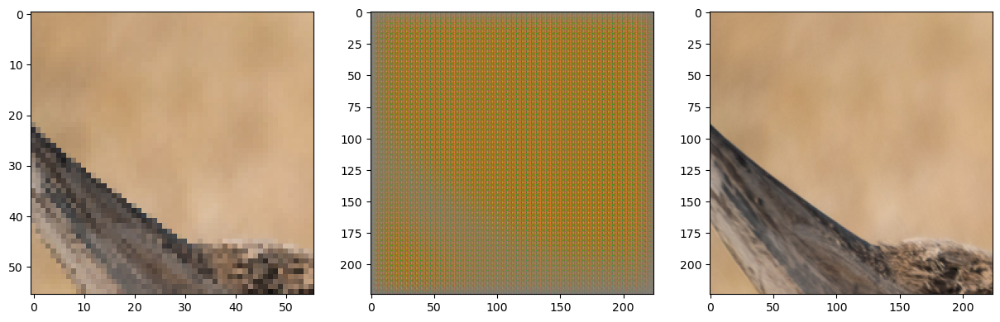

epochs 1 step 71 2201 G loss 0.12635 D loss 0.32144
predict real: 0.984
predict_fake: 0.465

epochs 1 step 73 2201 G loss 0.12082 D loss 0.31965
predict real: 0.999
predict_fake: 0.47

epochs 1 step 75 2201 G loss 0.3308 D loss 0.33996
predict real: 0.945
predict_fake: 0.463

epochs 1 step 77 2201 G loss 0.10784 D loss 0.34881
predict real: 0.918
predict_fake: 0.456

epochs 1 step 79 2201 G loss 0.1453 D loss 0.38181
predict real: 0.811
predict_fake: 0.411



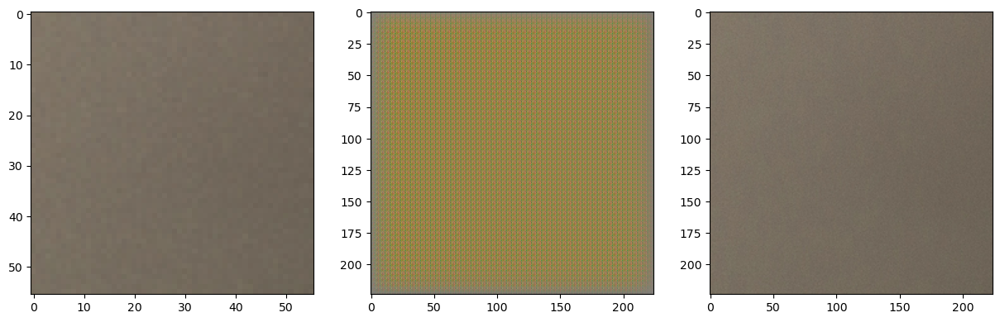

epochs 1 step 81 2201 G loss 0.22063 D loss 0.36614
predict real: 0.839
predict_fake: 0.416

epochs 1 step 83 2201 G loss 0.28444 D loss 0.26011
predict real: 0.969
predict_fake: 0.385

epochs 1 step 85 2201 G loss 0.21347 D loss 0.23363
predict real: 0.996
predict_fake: 0.369

epochs 1 step 87 2201 G loss 0.17536 D loss 0.25156
predict real: 1.0
predict_fake: 0.393



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 89 2201 G loss 0.24611 D loss 0.22921
predict real: 0.995
predict_fake: 0.364



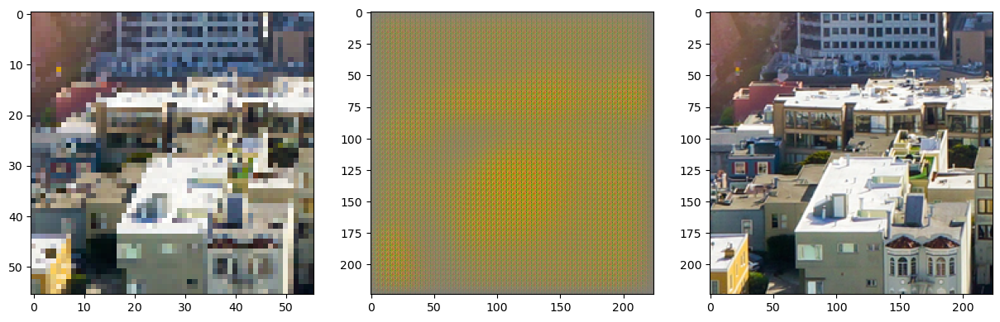

epochs 1 step 91 2201 G loss 0.19748 D loss 0.21545
predict real: 0.996
predict_fake: 0.344

epochs 1 step 93 2201 G loss 0.24633 D loss 0.20655
predict real: 0.961
predict_fake: 0.311

epochs 1 step 95 2201 G loss 0.14385 D loss 0.20221
predict real: 0.996
predict_fake: 0.329

epochs 1 step 97 2201 G loss 0.2019 D loss 0.13547
predict real: 1.0
predict_fake: 0.237



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 99 2201 G loss 0.32438 D loss 0.17006
predict real: 1.0
predict_fake: 0.284



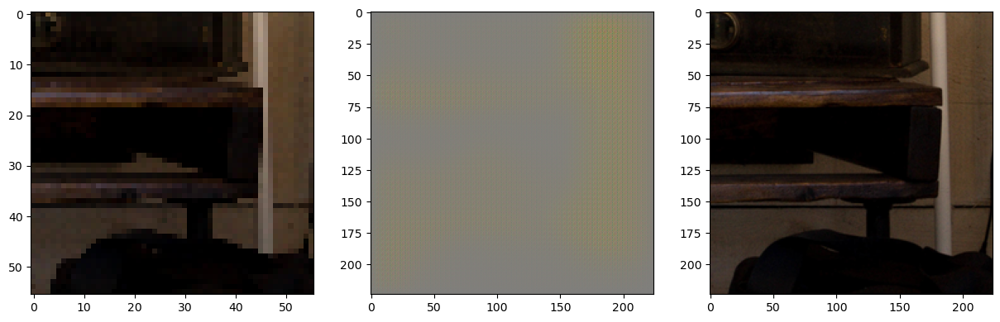

epochs 1 step 101 2201 G loss 0.14725 D loss 0.09666
predict real: 1.0
predict_fake: 0.175

epochs 1 step 103 2201 G loss 0.20423 D loss 0.07495
predict real: 1.0
predict_fake: 0.139

epochs 1 step 105 2201 G loss 0.11941 D loss 0.05265
predict real: 1.0
predict_fake: 0.1

epochs 1 step 107 2201 G loss 0.13491 D loss 0.0694
predict real: 0.98
predict_fake: 0.111



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 109 2201 G loss 0.14754 D loss 0.08256
predict real: 0.997
predict_fake: 0.149



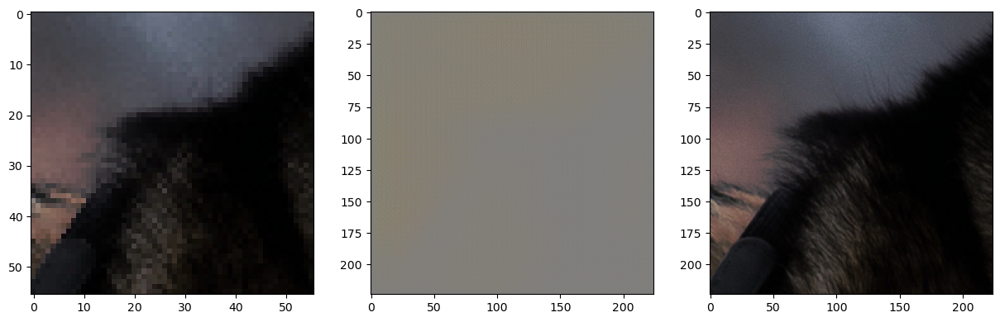

epochs 1 step 111 2201 G loss 0.22669 D loss 0.05788
predict real: 1.0
predict_fake: 0.109

epochs 1 step 113 2201 G loss 0.3665 D loss 0.02588
predict real: 1.0
predict_fake: 0.05

epochs 1 step 115 2201 G loss 0.12665 D loss 0.03122
predict real: 1.0
predict_fake: 0.06

epochs 1 step 117 2201 G loss 0.30664 D loss 0.01101
predict real: 1.0
predict_fake: 0.022



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 119 2201 G loss 0.18579 D loss 0.01069
predict real: 1.0
predict_fake: 0.021



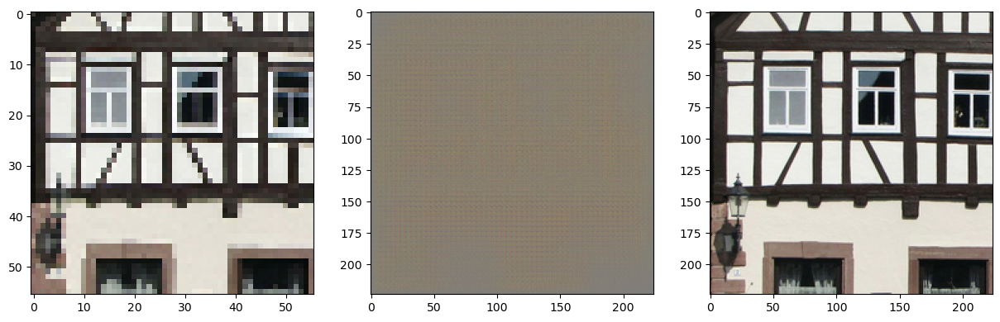

epochs 1 step 121 2201 G loss 0.26678 D loss 0.00915
predict real: 1.0
predict_fake: 0.018

epochs 1 step 123 2201 G loss 0.09348 D loss 0.00757
predict real: 1.0
predict_fake: 0.015

epochs 1 step 125 2201 G loss 0.9465 D loss 0.00342
predict real: 1.0
predict_fake: 0.007

epochs 1 step 127 2201 G loss 0.29932 D loss 1.03804
predict real: 0.508
predict_fake: 0.005

epochs 1 step 129 2201 G loss 0.4833 D loss 0.00645
predict real: 1.0
predict_fake: 0.013



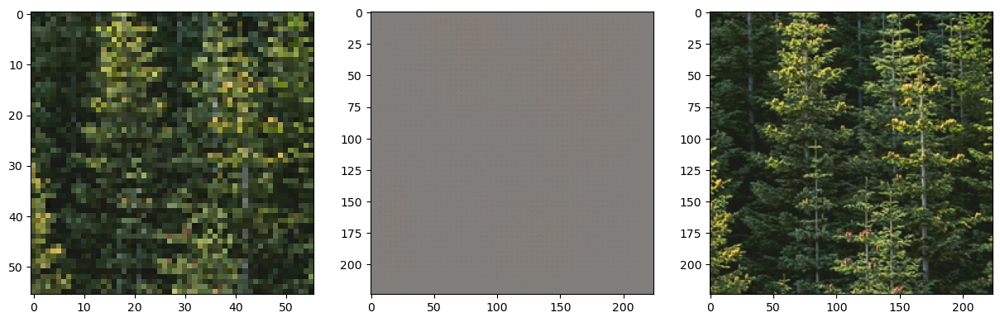

epochs 1 step 131 2201 G loss 0.0962 D loss 0.01575
predict real: 1.0
predict_fake: 0.031

epochs 1 step 133 2201 G loss 0.45412 D loss 0.03442
predict real: 1.0
predict_fake: 0.067

epochs 1 step 135 2201 G loss 0.23152 D loss 0.1469
predict real: 1.0
predict_fake: 0.249

epochs 1 step 137 2201 G loss 0.48406 D loss 0.1389
predict real: 1.0
predict_fake: 0.237



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 139 2201 G loss 0.32418 D loss 0.08872
predict real: 1.0
predict_fake: 0.159



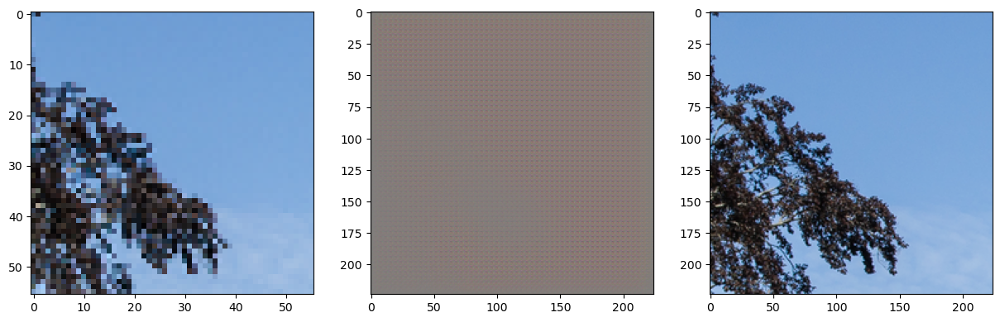

epochs 1 step 141 2201 G loss 0.28634 D loss 0.09154
predict real: 1.0
predict_fake: 0.164

epochs 1 step 143 2201 G loss 0.16272 D loss 0.21782
predict real: 1.0
predict_fake: 0.296

epochs 1 step 145 2201 G loss 0.18913 D loss 1.18947
predict real: 1.0
predict_fake: 0.868

epochs 1 step 147 2201 G loss 0.19615 D loss 0.01122
predict real: 1.0
predict_fake: 0.022



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 149 2201 G loss 0.23595 D loss 0.00011
predict real: 1.0
predict_fake: 0.0



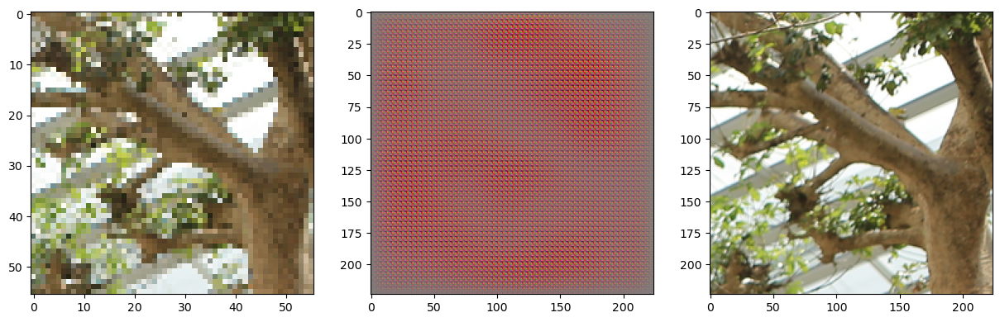

epochs 1 step 151 2201 G loss 0.15176 D loss 4e-05
predict real: 1.0
predict_fake: 0.0

epochs 1 step 153 2201 G loss 0.20347 D loss 0.14848
predict real: 0.991
predict_fake: 0.242

epochs 1 step 155 2201 G loss 0.23767 D loss 3.17912
predict real: 1.0
predict_fake: 0.892

epochs 1 step 157 2201 G loss 0.27885 D loss 0.00552
predict real: 1.0
predict_fake: 0.011



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epochs 1 step 159 2201 G loss 0.30395 D loss 0.94542
predict real: 0.505
predict_fake: 0.0



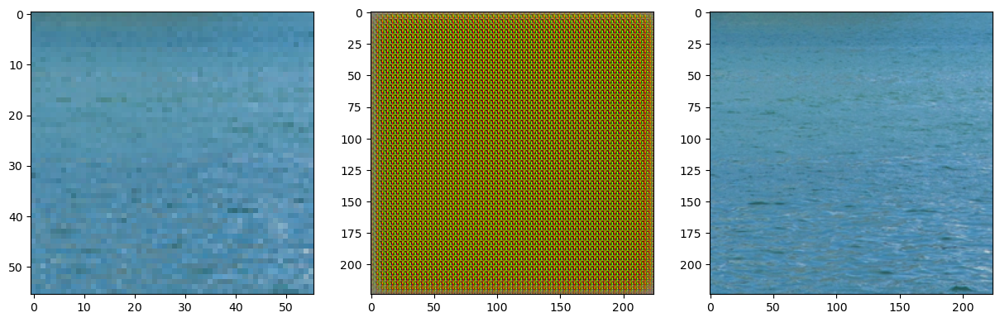

epochs 1 step 161 2201 G loss 0.4851 D loss 1.64409
predict real: 0.501
predict_fake: 0.0

epochs 1 step 163 2201 G loss 0.55074 D loss 3.36346
predict real: 0.051
predict_fake: 0.404



In [ ]:
epochs = 2000
batchs = 2
lr_g = 0.0001
lr_d = 0.0001

show_process = True
show_every_n = 10

imgs = []
optim_g = tf.optimizers.Adam(lr_g)
optim_d = tf.optimizers.Adam(lr_d)

losses = {"G":[], "D":[]}

for epoch in range(1, epochs+1):
    
    for i in range(1, len(im_inx)+1):
        try:
            img = cv2.imread(im_inx[i-1])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = tf.image.random_crop(img, (224,224,3)).numpy()
            imgs.append(img)
        except: continue

        if len(imgs) >= batchs or epoch == epochs:
            imgs_tensor_hr = tf.convert_to_tensor(imgs, dtype=tf.float32).numpy()
            imgs_tensor_lr = tf.image.resize(imgs_tensor_hr, (56, 56), method=tf.image.ResizeMethod.BICUBIC).numpy()
            imgs = []

            with tf.GradientTape() as tape_g, tf.GradientTape() as tape_d:
                imgs_tensor_sr = Generator(imgs_tensor_lr/255)
                hr_disc = Discriminator(imgs_tensor_hr / 255 * 2 - 1 )
                sr_disc = Discriminator(imgs_tensor_sr)
                imgs_tensor_sr = tf.cast((imgs_tensor_sr + 1)*255/2, dtype=tf.int32)

                loss_g = tf.losses.binary_crossentropy(tf.ones(shape = sr_disc.shape), sr_disc) * 0.001
                loss_g += tf.math.reduce_mean(tf.square((feature_extractor(imgs_tensor_sr)/ 12.75) - (feature_extractor(imgs_tensor_hr)/ 12.75)), axis=(1,2,3))
                loss_d = (tf.losses.binary_crossentropy(tf.zeros(shape = sr_disc.shape), sr_disc) + tf.losses.binary_crossentropy(tf.ones(shape = hr_disc.shape), hr_disc)) / 2
                
            optim_g.minimize(loss_g, Generator.trainable_variables, tape=tape_g)
            optim_d.minimize(loss_d, Discriminator.trainable_variables, tape = tape_d)

            print("epochs", epoch, "step", i, len(im_inx), "G loss", round(np.mean(loss_g),5), "D loss", round(np.mean(loss_d), 5))
            print("predict real:", round(np.mean(hr_disc),3))
            print("predict_fake:", round(np.mean(sr_disc),3))
            print()

        if show_process and i % show_every_n * batchs == 0:
            plt.figure(figsize=(15,15))
            plt.subplot(1,3,1); plt.imshow(imgs_tensor_lr[-1]/255)
            plt.subplot(1,3,2); plt.imshow(imgs_tensor_sr[-1].numpy())
            plt.subplot(1,3,3); plt.imshow(imgs_tensor_hr[-1]/255)
            plt.show()

    Generator.save(googledrive_path + 'Generator.h5')
    Discriminator.save(googledrive_path + 'Discriminator.h5')